<font size="6.2">Summary</font>  

PyTorch is an open-source deep learning library developed by Facebook’s AI Research lab, widely used for creating and training neural networks. This notebook provides a brief overview of its applications. It begins with image classification using a Convolutional Neural Network (CNN), followed by fine-tuning a pretrained ResNet-18 model for the same task. Next, it introduces object detection using R-CNN and Fast R-CNN, demonstrating their implementation in PyTorch. Finally, it covers evaluation techniques such as Intersection over Union (IoU) and Non-Maximum Suppression (NMS), including their implementation. 

Python functions and data files needed to run this notebook are available via this [link](https://github.com/MehdiRezvandehy/LangChain-in-Action-LLM-Applications-with-RAG-and-Agents.git).

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction</a></span><ul class="toc-item"><li><span><a href="#What-is-a-CNN?" data-toc-modified-id="What-is-a-CNN?-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>What is a CNN?</a></span></li><li><span><a href="#Classification-with-CNN" data-toc-modified-id="Classification-with-CNN-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Classification with CNN</a></span><ul class="toc-item"><li><span><a href="#CNN-Binary-Classifier" data-toc-modified-id="CNN-Binary-Classifier-1.2.1"><span class="toc-item-num">1.2.1&nbsp;&nbsp;</span>CNN Binary Classifier</a></span><ul class="toc-item"><li><span><a href="#Use-a-Pre-trained-Model" data-toc-modified-id="Use-a-Pre-trained-Model-1.2.1.1"><span class="toc-item-num">1.2.1.1&nbsp;&nbsp;</span>Use a Pre-trained Model</a></span></li></ul></li></ul></li></ul></li><li><span><a href="#Object-Recognition" data-toc-modified-id="Object-Recognition-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Object Recognition</a></span><ul class="toc-item"><li><span><a href="#Converting-Pixels-to-Tensors" data-toc-modified-id="Converting-Pixels-to-Tensors-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Converting Pixels to Tensors</a></span></li><li><span><a href="#Drawing-the-bounding-box" data-toc-modified-id="Drawing-the-bounding-box-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Drawing the bounding box</a></span></li><li><span><a href="#Two-Stage-Object-Detection" data-toc-modified-id="Two-Stage-Object-Detection-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Two-Stage Object Detection</a></span></li></ul></li><li><span><a href="#Implement-R-CNN" data-toc-modified-id="Implement-R-CNN-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Implement R-CNN</a></span><ul class="toc-item"><li><span><a href="#Dogs-vs-Cats-(Bounding-Boxes-Added)" data-toc-modified-id="Dogs-vs-Cats-(Bounding-Boxes-Added)-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Dogs vs Cats (Bounding Boxes Added)</a></span></li><li><span><a href="#Look-at-the-Images" data-toc-modified-id="Look-at-the-Images-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Look at the Images</a></span></li><li><span><a href="#Prediction" data-toc-modified-id="Prediction-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Prediction</a></span></li><li><span><a href="#Look-at-Predictions" data-toc-modified-id="Look-at-Predictions-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Look at Predictions</a></span></li></ul></li><li><span><a href="#Implement-Faster-R-CNN" data-toc-modified-id="Implement-Faster-R-CNN-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Implement Faster R-CNN</a></span><ul class="toc-item"><li><span><a href="#Prediction" data-toc-modified-id="Prediction-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Prediction</a></span></li><li><span><a href="#Look-at-Prediction" data-toc-modified-id="Look-at-Prediction-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Look at Prediction</a></span></li></ul></li><li><span><a href="#Intersection-over-Union-(IoU)" data-toc-modified-id="Intersection-over-Union-(IoU)-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Intersection over Union (IoU)</a></span><ul class="toc-item"><li><span><a href="#Non-Max-Suppression-(NMS)" data-toc-modified-id="Non-Max-Suppression-(NMS)-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Non-Max Suppression (NMS)</a></span></li><li><span><a href="#Non-Max-Suppression-in-PyTorch" data-toc-modified-id="Non-Max-Suppression-in-PyTorch-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Non-Max Suppression in PyTorch</a></span></li></ul></li></ul></div>

https://medium.com/analytics-vidhya/how-to-build-a-visual-search-engine-64046e58ad2f

# Introduction 

PyTorch is an open-source deep learning library developed by **Facebook's AI Research lab**. It's widely used for building and training neural networks. Here's a brief overview:

- **Dynamic Computation Graphs**: PyTorch uses dynamic (or "eager") computation graphs, meaning the graph is built on-the-fly as operations are executed. This makes debugging and experimentation easier.

- **Tensors**: The core data structure in PyTorch is the **tensor**, similar to NumPy arrays but with GPU support for faster computation.

- **Autograd**: PyTorch has built-in automatic differentiation using `autograd`, which tracks operations on tensors and computes gradients for backpropagation.

- **Modules and Layers**: Models in PyTorch are built using the `nn.Module` class, making it easy to define complex architectures by stacking layers.

- **Optimizers**: PyTorch provides various optimization algorithms like SGD, Adam, etc., via `torch.optim` to update model weights.

- **GPU Support**: It supports CUDA for running models on NVIDIA GPUs, allowing efficient training of large models.


## What is a CNN?

A **Convolutional Neural Network (CNN)** is a deep learning architecture specialized for **processing grid-like data**, such as images. It is highly effective for tasks like **image classification, object detection, and image segmentation**.

Typical CNN architectures stack convolutional layers (each followed by a ReLU layer), then a pooling layer, another few convolutional layers (+ReLU) next, followed by another pooling layer. This process can be repeated. See Figure below a:


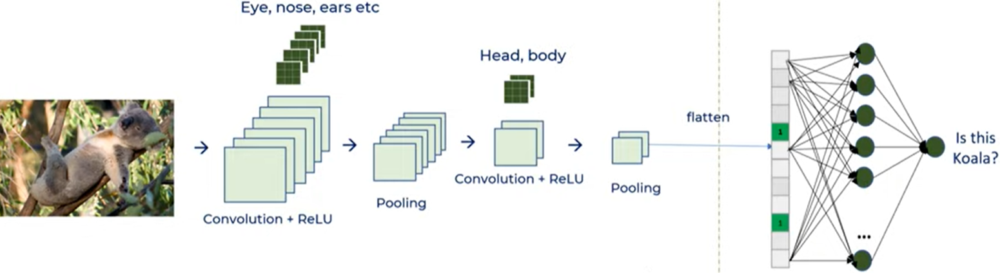


As image progresses through the network, it gets smaller and smaller. At the top of the stack, a regular feedforward neural network is added, composed of a few fully connected layers (+ReLUs), and the final layer outputs the prediction. Figure below shows how to Flatten a 3x3 image matrix into a 9x1 vector:

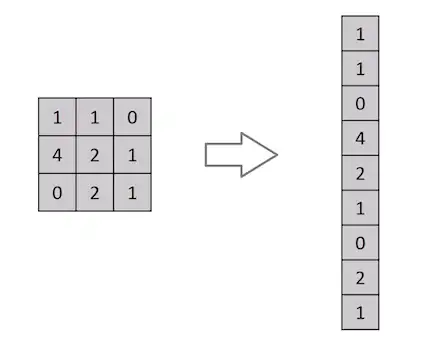


**Typically networks gets deeper and deeper (with more feature maps) as progress through network.**

🔷 **Key Components of a CNN**:

1. **Input Layer**  
   - Takes in an image.

2. **Convolutional Layers**  
   - Applies **filters (kernels)** to scan the image and detect **low-level features** like edges, corners, textures.
   - Produces **feature maps**.
   - Each filter learns a different pattern.
   
![Funny Dog](https://towardsdatascience.com/wp-content/uploads/2022/06/1OVeduMtpBhsRKZBrc6u5Eg.gif)
Image retrieved from https://towardsdatascience.com/convolutional-neural-networks-explained-how-to-successfully-classify-images-in-python-df829d4ba761/

3. **Activation Function (ReLU)**  
   - Introduces **non-linearity** after convolution.
   - Replaces negative values with zero: `ReLU(x) = max(0, x)`.

4. **Pooling Layers (e.g., Max Pooling)**  
   - Reduces the spatial size of the feature maps.
   - Helps **reduce computation** and **prevent overfitting**.
   - Example: 2×2 max pooling selects the largest value in each 2×2 block.
   
   
![Funny Dog](https://towardsdatascience.com/wp-content/uploads/2022/03/1ks0WgDXWP6xnENC1t09U3A.gif)
Image retrieved from https://towardsdatascience.com/convolutional-neural-networks-explained-how-to-successfully-classify-images-in-python-df829d4ba761/ 

5. **Fully Connected Layers (FC)**  
   - Flatten the feature maps and feed them into standard dense layers.
   - These layers learn to make decisions based on the extracted features.

6. **Output Layer**  
   - Binary classification: 1 neuron + sigmoid activation.
   - Multiclass classification: N neurons + softmax activation.


## Classification with CNN

* **Binary Classification**
  - Goal: Classify input into one of two classes (e.g., **cat vs not-cat**).
  - Workflow:
     1. **Input**: An image.
     2. **CNN Layers**: Apply convolution, ReLU activation, and pooling to extract features.
     3. **Flatten** the feature maps.
     4. **Fully Connected Layer** to combine features.
     5. **Output Layer**: Single neuron with **sigmoid activation**.
        - Output: Probability between 0 and 1.


* **Multiclass Classification**
    - **Goal**: Classify input into one of **multiple categories** (e.g., digits **0-9**).
    - **Workflow**:
      1. **Input**: A color image (e.g., 28×28 RGB image of a handwritten digit).
      2. **CNN Layers**: Stack of convolution, ReLU, and pooling layers.
      3. **Flatten** the final feature maps.
      4. **Fully Connected Layers** to learn high-level patterns.
      5. **Output Layer**: Multiple neurons (one per class) with **softmax activation**.
         - Output: Probability distribution across all classes.
         - Prediction: Class with the highest probability.



   **Main Differences**:
   | Aspect              | Binary Classification     | Multiclass Classification       |
   |---------------------|---------------------------|----------------------------------|
   | Output Activation   | Sigmoid                   | Softmax                         |
   | Output Neurons      | 1                         | Equal to number of classes      |
   | Loss Function       | Binary Cross-Entropy      | Categorical Cross-Entropy       |


In [1]:
import os

In [2]:
base_dir = './Data' # Directory dataset
#os.mkdir(base_dir)

In [3]:
# Directories for the training, validation, and test splits
train_dir = os.path.join(base_dir, 'train')   
#os.mkdir(train_dir)   

In [4]:
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms

In [5]:
train_dataset = ImageFolder(root=train_dir, transform=transforms)
train_dataset

Dataset ImageFolder
    Number of datapoints: 2000
    Root location: ./Data\train
    StandardTransform
Transform: <module 'torchvision.transforms' from 'C:\\Users\\mrezv\\anaconda3\\envs\\faiss-env\\lib\\site-packages\\torchvision\\transforms\\__init__.py'>

In [6]:
classes = train_dataset.classes
print(classes)

['cats', 'dogs']


In [7]:
print(train_dataset.class_to_idx)

{'cats': 0, 'dogs': 1}


Random image path: ./Data/train/dogs\dog.688.jpg
Image class: dogs
Image height: 166
Image width: 240


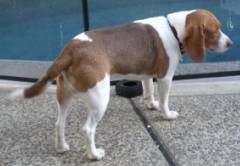

In [8]:
import random
from pathlib import Path
from PIL import Image
import glob

# Set seed
random.seed(42) 

# 1. Get all image paths (* means "any combination")
image_path_list= glob.glob(f"./Data/train/dogs/*.jpg")

# 2. Get random image path
random_image_path = random.choice(image_path_list)

# 3. Get image class from path name (the image class is the name of the directory where the image is stored)
image_class = Path(random_image_path).parent.stem

# 4. Open image
img = Image.open(random_image_path)

# 5. Print metadata
print(f"Random image path: {random_image_path}")
print(f"Image class: {image_class}")
print(f"Image height: {img.height}") 
print(f"Image width: {img.width}")
img

In [9]:
# ✅ Define transform first
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),    # Resize images here!
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

# ✅ Then apply to ImageFolder
from torchvision.datasets import ImageFolder
train_dataset = ImageFolder(root=train_dir, transform=transform)

# ✅ Load with DataLoader
from torch.utils.data import DataLoader
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

In [10]:
# Check a single batch to make sure it works
for images, labels in train_loader:
    print(f"Batch image shape: {images.shape}")  # Should be [32, 3, 224, 224]
    print(f"Batch label shape: {labels.shape}")  # Should be [32]
    break

Batch image shape: torch.Size([32, 3, 224, 224])
Batch label shape: torch.Size([32])


###  CNN Binary Classifier

In [11]:
import torch
import torch.nn as nn

class ImageBinaryClassifier(nn.Module):
    def __init__(self):
        super(ImageBinaryClassifier, self).__init__()

        # Input: 3 RGB channels (red, green, blue)
        # Output: 16 channels
        # Kernel: 3 x 3 matrix
        # Stride = 1: the kernel moves 1 step
        # Padding = 1: 1 pixel around the border
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=1)

        # ReLU activation introduces non-linearity to help the model learn complex patterns
        self.relu = nn.ReLU()

        # Max pooling layer:
        # using a 2x2 window and a stride of 2
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Flatten layer:
        # Converts 3D feature maps (batch_size x channels x height x width) into 1D vectors
        # Required before feeding into a fully connected (dense) layer
        self.flatten = nn.Flatten()

        # Fully connected (linear) layer:
        # Input features: 16 channels × 112 × 112 pixels (after pooling)
        # Output: 1 neuron, used for binary classification (output in range 0-1)
        self.fc1 = nn.Linear(16 * 112 * 112, 1)

        # Sigmoid activation:
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Apply 1st conv layer, followed by ReLU activation
        x = self.relu(self.conv1(x))

        # Apply max pooling to reduce spatial dimensions
        x = self.pool(x)

        # Flatten the output to prepare for the fully connected layer
        x = self.flatten(x)

        # Apply fully connected layer
        x = self.fc1(x)

        # Apply sigmoid to get a probability output between 0 and 1
        x = self.sigmoid(x)

        return x


In [12]:
# Load model
model = ImageBinaryClassifier()
#model.load_state_dict(torch.load("model.pth", map_location=torch.device('cpu')))
model.eval()

ImageBinaryClassifier(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu): ReLU()
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=200704, out_features=1, bias=True)
  (sigmoid): Sigmoid()
)

In [13]:
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ImageBinaryClassifier().to(device)

# Binary classification — use BCELoss
criterion = nn.BCELoss()

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [14]:
num_epochs = 5

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device)  # shape: [batch, 1]

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss:.4f}")

Epoch [1/5], Loss: 45.0474
Epoch [2/5], Loss: 39.3734
Epoch [3/5], Loss: 36.7471
Epoch [4/5], Loss: 34.7636
Epoch [5/5], Loss: 32.4146


* **Prediction on test set**

In [15]:
torch.save(model.state_dict(), './models/binary_model.pth')

In [16]:
test_dir = os.path.join(base_dir, 'test') 
#os.mkdir(test_dir)   

In [17]:
test_dataset = ImageFolder(root=test_dir, transform=transform)

In [18]:
classes = test_dataset.classes
print(classes)

print(test_dataset.class_to_idx)

['cats', 'dogs']
{'cats': 0, 'dogs': 1}


In [19]:
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [20]:
# Check a single batch to make sure it works
for images, labels in test_loader:
    print(f"Batch image shape: {images.shape}")  # Should be [32, 3, 224, 224]
    print(f"Batch label shape: {labels.shape}")  # Should be [32]
    break

Batch image shape: torch.Size([32, 3, 224, 224])
Batch label shape: torch.Size([32])


In [21]:
all_preds = []
all_labels = []

with torch.no_grad():  # Disable gradients for faster inference
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device).to(device)

        outputs = model(images)            # Raw output from sigmoid
        preds = (outputs > 0.5).int()      # Convert to 0 (cat) or 1 (dog)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())


In [22]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(all_labels, all_preds)
print(f"Test Accuracy: {accuracy:.2%}")

Test Accuracy: 63.20%


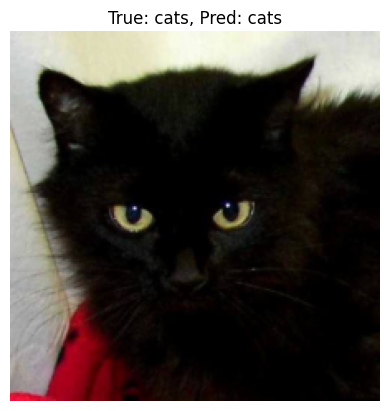

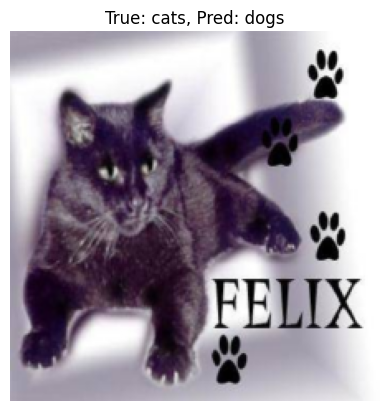

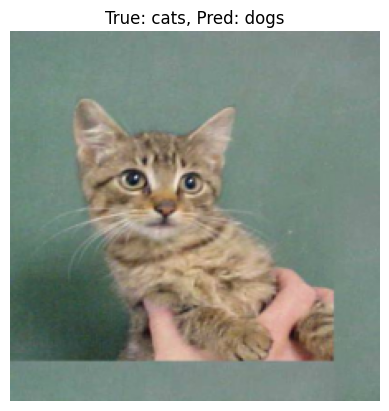

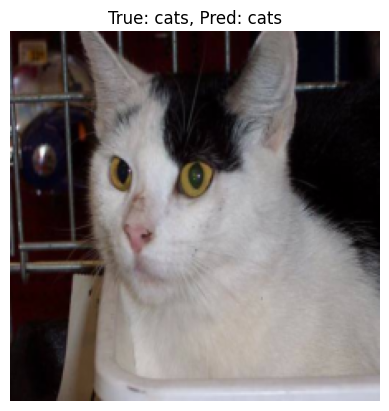

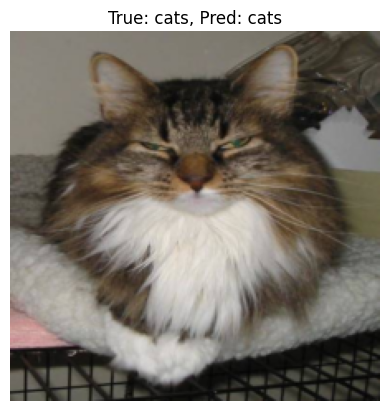

In [23]:
import matplotlib.pyplot as plt

model.eval()
class_names = train_dataset.classes  # ['cat', 'dog']

with torch.no_grad():
    images, labels = next(iter(test_loader))
    outputs = model(images.to(device))
    preds = (outputs > 0.5).int().cpu().numpy()

    # Plot first 6 images with predictions
    for i in range(5):
        img = images[i].permute(1, 2, 0).numpy() * 0.5 + 0.5  # unnormalize
        plt.imshow(img)
        plt.title(f"True: {class_names[labels[i]]}, Pred: {class_names[preds[i][0]]}")
        plt.axis('off')
        plt.show()

#### Use a Pre-trained Model 

The current CNN is very basic. Instead, we can use a pretrained model to boost the performance:

🧠 1. **Choose a Pre-trained Model**

Pick a model that’s already trained on a large dataset (e.g., ImageNet). Popular choices include:
- **ResNet18 / ResNet50**
- **VGG16**
- **EfficientNet**
- **MobileNet**

These models already know how to extract useful image features (like edges, textures, shapes).


🧊 2. **Freeze the Pre-trained Layers**

To avoid retraining everything from scratch, we **freeze the early layers**. These layers contain general-purpose filters (e.g., edge detectors), which are useful for almost any image task.

Freezing means:
- Their weights won’t change.
- It speeds up training and avoids overfitting.


🧩 3. **Replace the Final Layer (Classifier)**

Pre-trained models are trained for 1000 classes. But your task might be:
- **Binary classification** (e.g., cat vs dog)
- **Multiclass** (e.g., apple, banana, orange)

So we **remove the original final layer** and **add a new one** that fits your number of output classes.


🧪 4. **Train Only the New Layer**

You then **train just the final layer**:
- It learns how to map pre-learned features to your new task.
- This requires much less data and compute than training the whole model.

The rest of the model still extracts features from the images as before.


💡 5. (Optional) Fine-Tune Later

Once the new layer is trained, you can optionally **unfreeze some of the deeper layers** and fine-tune them with a low learning rate. This gives even better performance, especially if your dataset is large or different from ImageNet.


💾 6. **Save and Load the Model**

After training, you can **save your model locally** so you can reuse it later without retraining.

Later, you **load the model** to:
- Make predictions on new data.
- Resume training if needed.


In [24]:
from torchvision import models

model = models.resnet18(pretrained=True)

# Freeze All Layers (except fc)
for param in model.parameters():
    param.requires_grad = False  # Freeze feature extractor

# Replace final layer for binary classification
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, 1),
    nn.Sigmoid()
)

C:\Users\mrezv\anaconda3\envs\faiss-env\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\mrezv\anaconda3\envs\faiss-env\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [25]:
# Train Only model.fc
optimizer = torch.optim.Adam(model.fc.parameters(), lr=1e-4)
loss_fn = nn.BCELoss()  # Use BCE since we have sigmoid in final layer

In [26]:
# Move Model to Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [27]:
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device)  # [batch_size, 1]

        outputs = model(images)
        loss = loss_fn(outputs, labels) 

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss:.4f}")

Epoch [1/5], Loss: 42.4384
Epoch [2/5], Loss: 34.8734
Epoch [3/5], Loss: 29.4266
Epoch [4/5], Loss: 25.1113
Epoch [5/5], Loss: 22.2969


In [28]:
all_preds = []
all_labels = []

with torch.no_grad():  # Disable gradients for faster inference
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.float().unsqueeze(1).to(device).to(device)

        outputs = model(images)            # Raw output from sigmoid
        preds = (outputs > 0.5).int()      # Convert to 0 (cat) or 1 (dog)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())


In [29]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(all_labels, all_preds)
print(f"Test Accuracy: {accuracy:.2%}")

Test Accuracy: 52.20%


In [30]:
all_labels[:20]

[array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32),
 array([0.], dtype=float32)]

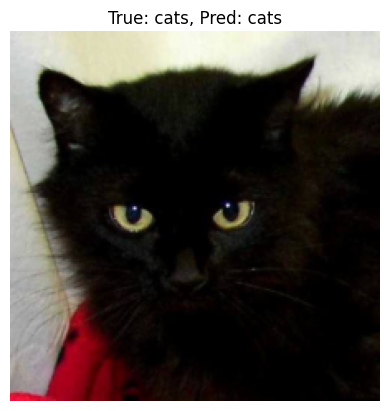

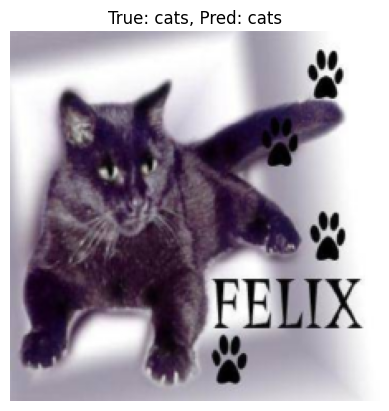

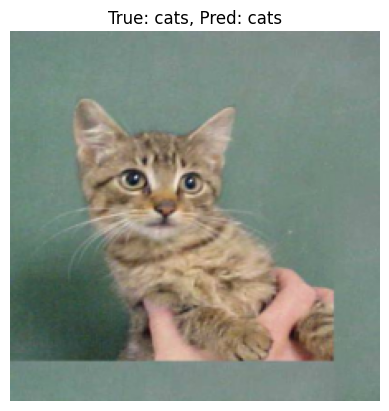

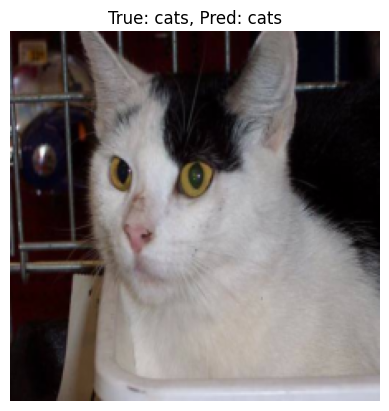

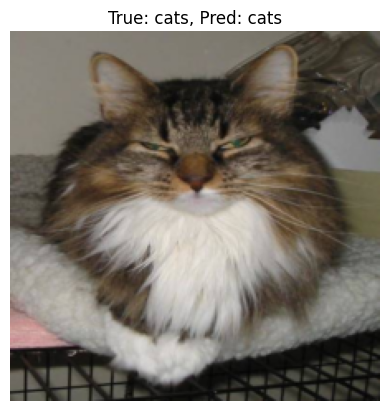

In [31]:
import matplotlib.pyplot as plt

model.eval()
class_names = train_dataset.classes  # ['cat', 'dog']

with torch.no_grad():
    images, labels = next(iter(test_loader))
    outputs = model(images.to(device))
    preds = (outputs > 0.5).int().cpu().numpy()

    # Plot first 6 images with predictions
    for i in range(5):
        img = images[i].permute(1, 2, 0).numpy() * 0.5 + 0.5  # unnormalize
        plt.imshow(img)
        plt.title(f"True: {class_names[labels[i]]}, Pred: {class_names[preds[i][0]]}")
        plt.axis('off')
        plt.show()


# Object Recognition

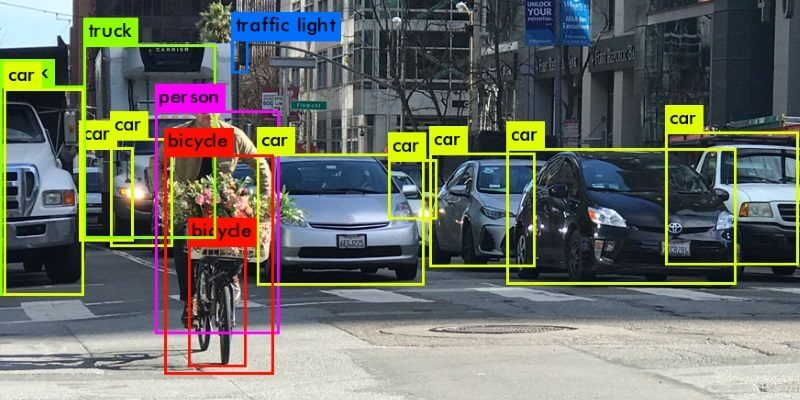
Image retrieved from https://www.aimtechnologies.co/image-recognition-technology-the-power-of-visual-intelligence/
- Identifies **objects within images**
- Provides:
  - The **location** of each object (via bounding boxes)
  - The **class label** for each object (e.g., cat, car, person)
- **Common applications** include:
  - Surveillance and security
  - Medical imaging and diagnosis
  - Traffic monitoring and management
  - Sports analytics and performance tracking


* **Bounding Box Representation**

   - A **rectangular box** used to indicate an object’s **position** within an image  
   - Describes the object’s **spatial location** (usually as coordinates)
   - Used in both:
     - **Training data annotations** (manually labeled boxes)
     - **Model outputs** (predicted boxes)
   - The **ground truth bounding box** represents the **accurate, human-labeled location** of the object

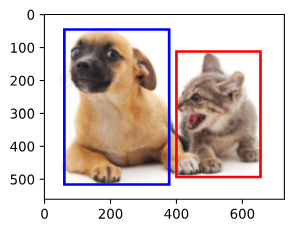

- A **rectangle** that defines an object’s **location** within an image  
- The **ground truth bounding box** refers to the **accurate, labeled position** of the object
- Bounding boxes are defined by their **corner coordinates**:
  - **Top-left** corner: (x₁, y₁)
  - **Bottom-right** corner: (x₂, y₂)
- So the format is:  
  **Bounding Box = (x₁, y₁, x₂, y₂)**  
  where:
  - `x₁` = minimum x (left edge)  
  - `y₁` = minimum y (top edge)  
  - `x₂` = maximum x (right edge)  
  - `y₂` = maximum y (bottom edge)
  
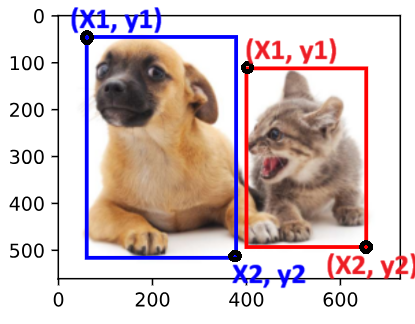  
  


## Converting Pixels to Tensors

Object detection models work with **tensors**, not raw image pixels. To convert images into tensors, we use **transforms**:

* 1️⃣ `transforms.ToTensor()`
  - Converts a **PIL Image or NumPy array** to a **normalized FloatTensor**
  - Scales pixel values from **[0, 255] → [0.0, 1.0]**
  - Output shape: **[C, H, W]** (channels, height, width)
  - Commonly used in training pipelines

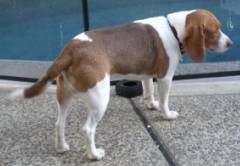

In [32]:
img = Image.open(random_image_path)
img

In [33]:
import torchvision.transforms as transforms

transform = transforms.Compose([transforms.Resize(224), transforms.ToTensor()])
image_tensor = transform(img)
print(image_tensor.shape)
image_tensor

torch.Size([3, 224, 323])


tensor([[[0.2510, 0.2510, 0.2510,  ..., 0.3176, 0.3176, 0.3216],
         [0.2471, 0.2471, 0.2471,  ..., 0.3176, 0.3176, 0.3176],
         [0.2392, 0.2392, 0.2392,  ..., 0.3176, 0.3176, 0.3176],
         ...,
         [0.4941, 0.5216, 0.5451,  ..., 0.5882, 0.5804, 0.5765],
         [0.4784, 0.5059, 0.5451,  ..., 0.6039, 0.5882, 0.5765],
         [0.4824, 0.5098, 0.5569,  ..., 0.6275, 0.6000, 0.5804]],

        [[0.3412, 0.3412, 0.3412,  ..., 0.4353, 0.4353, 0.4392],
         [0.3373, 0.3373, 0.3373,  ..., 0.4353, 0.4353, 0.4353],
         [0.3294, 0.3294, 0.3294,  ..., 0.4353, 0.4353, 0.4353],
         ...,
         [0.4784, 0.5059, 0.5294,  ..., 0.6000, 0.5922, 0.5882],
         [0.4627, 0.4902, 0.5294,  ..., 0.6157, 0.6000, 0.5882],
         [0.4667, 0.4941, 0.5412,  ..., 0.6392, 0.6118, 0.5922]],

        [[0.3961, 0.3961, 0.3961,  ..., 0.5294, 0.5294, 0.5333],
         [0.3922, 0.3922, 0.3922,  ..., 0.5294, 0.5294, 0.5294],
         [0.3843, 0.3843, 0.3843,  ..., 0.5294, 0.5294, 0.

* 2️⃣ `transforms.PILToTensor()`
  - Converts a **PIL Image** to a **raw integer tensor** (without scaling)
  - Pixel values remain in **[0, 255]**
  - Output shape: **[C, H, W]**
  - Useful when you want to keep original pixel intensity (e.g., for visualization or certain custom transformations)

In [34]:
import torchvision.transforms as transforms
transform = transforms.Compose([transforms.Resize(224), transforms.PILToTensor()])
image_tensor = transform(img)
print(image_tensor.shape)
image_tensor

torch.Size([3, 224, 323])


tensor([[[ 64,  64,  64,  ...,  81,  81,  82],
         [ 63,  63,  63,  ...,  81,  81,  81],
         [ 61,  61,  61,  ...,  81,  81,  81],
         ...,
         [126, 133, 139,  ..., 150, 148, 147],
         [122, 129, 139,  ..., 154, 150, 147],
         [123, 130, 142,  ..., 160, 153, 148]],

        [[ 87,  87,  87,  ..., 111, 111, 112],
         [ 86,  86,  86,  ..., 111, 111, 111],
         [ 84,  84,  84,  ..., 111, 111, 111],
         ...,
         [122, 129, 135,  ..., 153, 151, 150],
         [118, 125, 135,  ..., 157, 153, 150],
         [119, 126, 138,  ..., 163, 156, 151]],

        [[101, 101, 101,  ..., 135, 135, 136],
         [100, 100, 100,  ..., 135, 135, 135],
         [ 98,  98,  98,  ..., 135, 135, 135],
         ...,
         [119, 126, 132,  ..., 158, 156, 155],
         [115, 122, 132,  ..., 162, 158, 155],
         [116, 123, 135,  ..., 168, 161, 156]]], dtype=torch.uint8)

## Drawing the bounding box

To visualize object locations, you can **draw bounding boxes** using `draw_bounding_boxes` from `torchvision.utils`.


🧩 Steps to Draw Bounding Boxes:

   1. **Import the utility**  
      - Use `draw_bounding_boxes` from `torchvision.utils`
   
   2. **Collect bounding box coordinates**  
      - Store them as a **tensor** with shape `[num_boxes, 4]`  
      - Each box in format: `(x1, y1, x2, y2)`
   
   3. **Unsqueeze if needed**  
      - If the image tensor is 3D (`[C, H, W]`), add a batch dimension using `.unsqueeze(0)` to make it 4D  
      - Example shape: `[1, C, H, W]`
   
   4. **Convert the image (if needed)**  
      - Make sure the image is a `torch.Tensor` in **[0–255] range** and of type `uint8`  
      - If you used `ToTensor()` (scales to [0,1]), multiply by 255 and convert to `uint8`
   
   5. **Draw and visualize**  
      - Use `draw_bounding_boxes()` to overlay boxes on the image  
      - Plot using `matplotlib` or `PIL.Image`


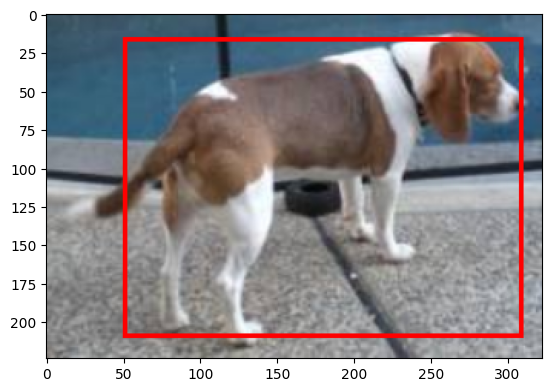

In [35]:
from torchvision.utils import draw_bounding_boxes

bbox = torch.tensor([50, 15, 310, 210])
bbox = bbox.unsqueeze(0)
bbox_image = draw_bounding_boxes(image_tensor, bbox, width=3, colors="red")

transform = transforms.Compose([transforms.ToPILImage()])

pil_image = transform(bbox_image)

import matplotlib.pyplot as plt
plt.imshow(pil_image)

## Two-Stage Object Detection

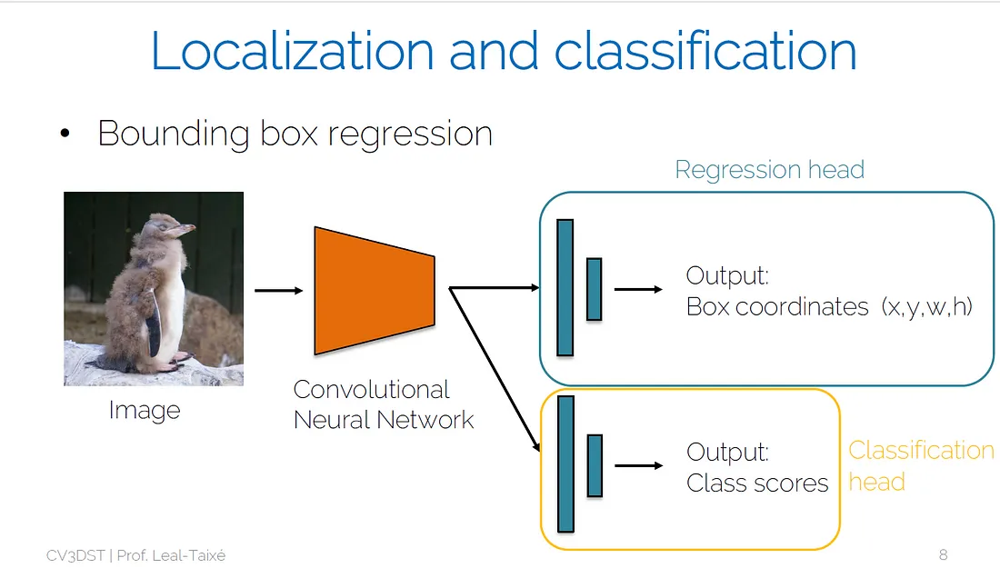
Image retrieved from https://namrata-thakur893.medium.com/a-detailed-introduction-to-two-stage-object-detectors-d4ba0c06b14e

Two-stage detectors work in **two main steps**:

1. **Region proposal network (RPN)** (Regression): Identify potential areas in the image where objects might exist.
2. **Classification + Bounding Box Refinement**: Analyze each proposed region to classify the object and refine the bounding box.

This approach focuses on **accuracy**, often at the cost of **speed**.


Common Two-Stage Models are:

1. **R-CNN** (Region-based Convolutional Neural Network)
   - **First model** to use CNNs for object detection
   - Steps:
     1. Uses an external algorithm (like Selective Search) to generate ~2,000 region proposals
     2. Extracts features from each region using a CNN
     3. Classifies each region and adjusts bounding boxes
   - **Drawback**: Very slow — processes each region separately


2. **Fast R-CNN**
   - **Improved version of R-CNN**
   - Processes the **entire image just once** with a CNN
   - Region proposals are applied to the feature map (not raw image)
   - Much faster because it avoids repeating CNN passes for every region
   - Still relies on **external region proposal algorithm** (e.g., Selective Search)


3. **Faster R-CNN**
   - **Most efficient and widely used two-stage detector**
   - Introduces a **Region Proposal Network (RPN)**:
     - Learns to propose regions directly within the model
     - Fully integrated with the detection pipeline
   - Achieves **high accuracy and speed**
   - Forms the backbone for many modern detection systems


| Model        | Region Proposals        | Speed     | Accuracy  | Notes                          |
|--------------|-------------------------|-----------|-----------|--------------------------------|
| R-CNN        | External (Selective Search) | Slow      | High      | First CNN-based detector       |
| Fast R-CNN   | External (Selective Search) | Faster    | High      | Single CNN pass per image      |
| Faster R-CNN | Learned (RPN)           | Much faster | Very high | Fully end-to-end model         |


The **backbone** Backbone in R-CNN (and other detection models) is the **convolutional neural network (CNN)** used to **extract features** from the input image.

- It processes the **raw image** and produces a **feature map** that represents textures, edges, shapes, and patterns in the image.
- These feature maps are then used for **region proposal** and **object classification**.


- In R-CNN specifically: the **backbone** is a **pretrained CNN** (often trained on ImageNet).
- Common backbones include:
  - **AlexNet** (used in the original R-CNN paper)
  - **VGG16**
  - **ResNet-50** or **ResNet-101** (used in modern variants)

**Example Flow in R-CNN**

   1. Input image → Region proposals generated by **Selective Search**
   2. Each region (cropped) → Passed through the **CNN backbone** (e.g., AlexNet)
   3. Features → Passed to a classifier (e.g., SVM) and bounding box regressor

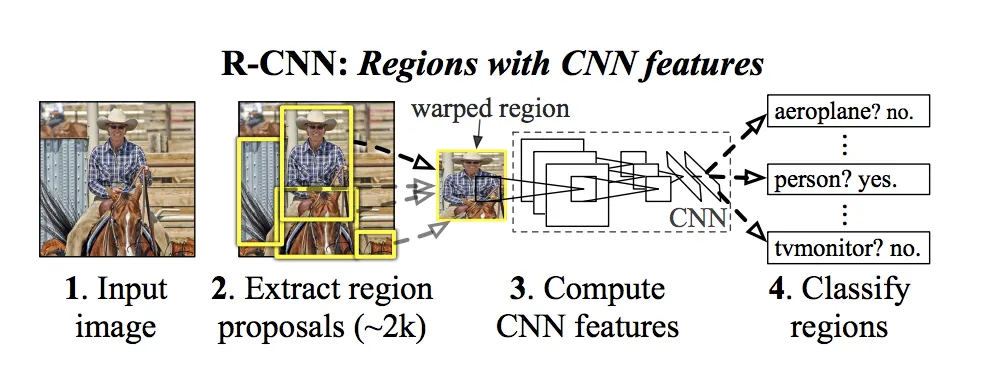
Image retrieved from https://miro.medium.com/v2/resize:fit:1100/format:webp/0*2DfHy1gJrjh5yj7F

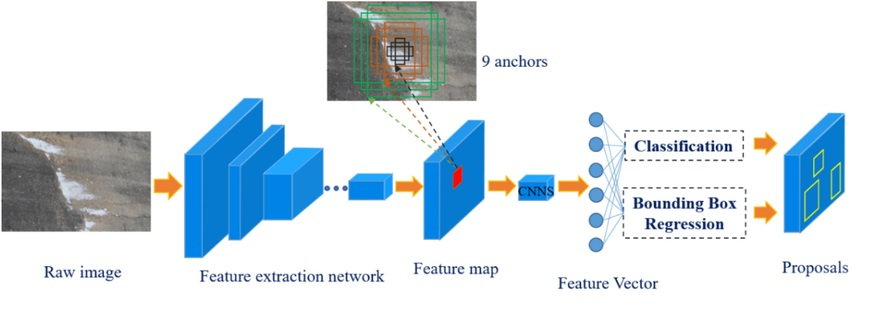
Image retrieved from https://viso.ai/deep-learning/faster-r-cnn-2/

# Implement R-CNN

In [36]:
# R-CNN: backbone with PyTorch
import torch.nn as nn 
from torchvision.models import vgg16, VGG16_Weights 
vgg = vgg16(weights=VGG16_Weights.DEFAULT)

backbone = nn.Sequential(*list (vgg.features.children()))

- `nn.Sequential(*list())`: all sub-layersare placed into a sequential block as a list

- `*`: unpacks the elements from the list

- `.features`: only convolutional layers
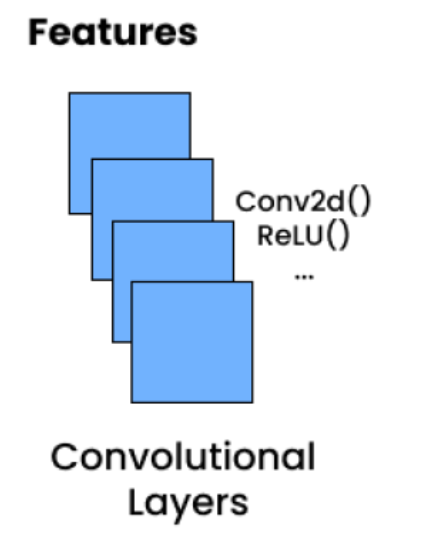
- `.children()`: all layers from block
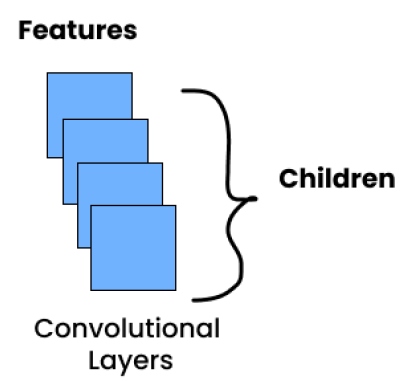

* Extract backbone's **output** size
```python
input_dimension = nn.Sequential(*list(
    backbone.classifier.children())
    )[0].in_features
```

* Box **regressor** layer
  * Sits on top of the backbone
  * 4 outputs for the 4 box coordinates

```python
classifier = nn.Sequential(
    nn.Linear(input_dimension, 512),
    nn.ReLU(),
    nn.Linear(512, num_classes),
)

```

* Create a new **classifier**
```python
classifier = nn.Sequential(
    nn.Linear(input_dimension, 512),
    nn.ReLU(),
    nn.Linear(512, num_classes),
)

```

Here is object detection class by putting together all parts:

In [37]:
class ObjectDetectorCNN(nn.Module):
    def __init__(self):
        super(ObjectDetectorCNN, self).__init__()
        vgg = vgg16(weights=VGG16_Weights.DEFAULT)
        self.backbone = nn.Sequential(*list(vgg.features.children()))
        input_features = nn.Sequential(*list(vgg.classifier.children()))[0].in_features
        
        self.classifier = nn.Sequential(
            nn.Linear(input_features, 512),
            nn.ReLU(),
            nn.Linear(512, 2),
        )
        self.box_regressor = nn.Sequential(
            nn.Linear(input_features, 32),
            nn.ReLU(),
            nn.Linear(32, 4),
        )
        
    def forward(self, x):
        features = self.backbone(x)
        bboxes = self.regressor(features)
        classes = self.classifier(features)
        
        return bboxes, classes

By putting together all parts, this class defines a **Convolutional Neural Network (CNN)** model for **object detection**, built on top of a pre-trained **VGG16** model from torchvision. It outputs:
- **Class predictions** (e.g., object or background)
- **Bounding box predictions** (coordinates of detected object)


In [38]:
import torch.nn as nn
from torchvision.models import vgg16, VGG16_Weights

class ObjectDetectorCNN(nn.Module):
    def __init__(self):
        super(ObjectDetectorCNN, self).__init__()

        # Load a pre-trained VGG16 model with default ImageNet weights
        vgg = vgg16(weights=VGG16_Weights.DEFAULT)

        # Use the convolutional feature extractor part of VGG16 as the backbone
        self.backbone = nn.Sequential(*list(vgg.features.children()))

        # Get the number of input features for the first fully connected layer in VGG16
        input_features = nn.Sequential(*list(vgg.classifier.children()))[0].in_features

        # Define a new classifier head for binary classification (2 classes)
        self.classifier = nn.Sequential(
            nn.Linear(input_features, 512),
            nn.ReLU(),
            nn.Linear(512, 2),  # Output: class scores (e.g., object vs. background)
        )

        # Define a bounding box regressor head to predict [x1, y1, x2, y2]
        self.box_regressor = nn.Sequential(
            nn.Linear(input_features, 32),
            nn.ReLU(),
            nn.Linear(32, 4),  # Output: bounding box coordinates
        )

    def forward(self, x):
        # Extract features from the input image using the CNN backbone
        features = self.backbone(x)

        # 'features' will be a feature map (4D tensor)
        features = torch.flatten(features, 1)

        # Apply the classifier and regressor heads
        bboxes = self.box_regressor(features)
        classes = self.classifier(features)

        return bboxes, classes  # Return both bounding boxes and class scores

- **Backbone (`self.backbone`)**: VGG16's convolutional layers used to extract features from the image.
- **Classifier (`self.classifier`)**: A small feedforward network that predicts the class of the object (binary in this case).
- **Box Regressor (`self.box_regressor`)**: A network that predicts the bounding box coordinates for the detected object.

## Dogs vs Cats (Bounding Boxes Added)

Modified version of Kaggle's classic "Dogs vs Cats" dataset with bounding boxes. The data is retrieved from [Kaggle](https://www.kaggle.com/datasets/andrewmvd/dog-and-cat-detection/data).

In [39]:
import os
import xml.etree.ElementTree as ET
from PIL import Image
import torch
from torch.utils.data import Dataset
import torchvision.transforms as T

class DogsCatsDataset(Dataset):
    def __init__(self, image_dir, annot_dir, transform=None, target_size=(224, 224)):
        self.image_dir = image_dir
        self.annot_dir = annot_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith(".png")]
        self.label_map = {"cat": 0, "dog": 1}
        self.target_size = target_size  # for resizing boxes

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_filename = self.image_files[idx]
        img_path = os.path.join(self.image_dir, img_filename)
        annot_path = os.path.join(self.annot_dir, img_filename.replace(".png", ".xml"))

        image = Image.open(img_path).convert("RGB")
        original_width, original_height = image.size

        # Parse XML
        tree = ET.parse(annot_path)
        root = tree.getroot()
        label_name = root.find("object").find("name").text
        label = self.label_map[label_name]

        bbox_xml = root.find("object").find("bndbox")
        xmin = float(bbox_xml.find("xmin").text)
        ymin = float(bbox_xml.find("ymin").text)
        xmax = float(bbox_xml.find("xmax").text)
        ymax = float(bbox_xml.find("ymax").text)

        # Scale bbox to match resized image size
        target_w, target_h = self.target_size
        x_scale = target_w / original_width
        y_scale = target_h / original_height

        xmin_scaled = xmin * x_scale
        xmax_scaled = xmax * x_scale
        ymin_scaled = ymin * y_scale
        ymax_scaled = ymax * y_scale

        bbox = torch.tensor([xmin_scaled, ymin_scaled, xmax_scaled, ymax_scaled], dtype=torch.float32)

        # Resize image
        if self.transform:
            image = self.transform(image)

        return image, bbox, torch.tensor(label)


In [40]:
from torch.utils.data import random_split

transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
])

dataset = DogsCatsDataset(
    image_dir="./Data/dog-and-cat-detection/images",
    annot_dir="./Data/dog-and-cat-detection/annotations",
    transform=transform
)

# Split sizes (e.g., 80% train / 20% test)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

# Random split
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

In [41]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

## Look at the Images 

In [42]:
for images, bboxes, labels in train_loader:
    print(f"Batch image shape: {images.shape}")  # Should be [32, 3, 224, 224]
    print(f"Batch label shape: {bboxes.shape}")  # Should be [32, 4]
    print(f"Batch label shape: {labels.shape}")  # Should be [32]
    break    

Batch image shape: torch.Size([32, 3, 224, 224])
Batch label shape: torch.Size([32, 4])
Batch label shape: torch.Size([32])


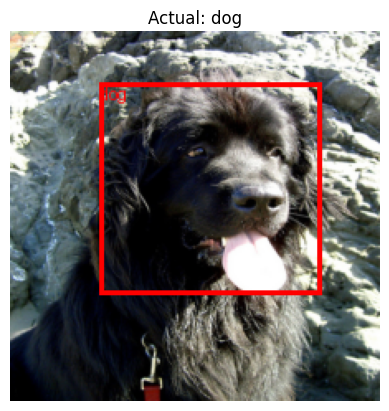

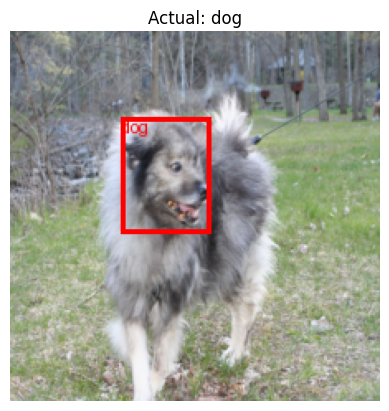

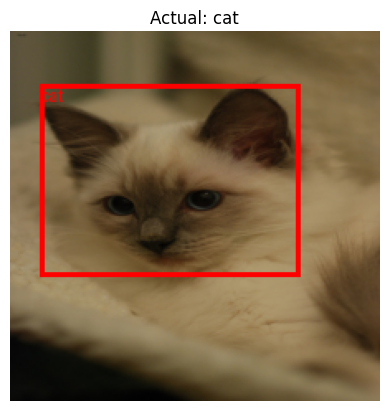

In [43]:
import torchvision.transforms.functional as F

# Look at the data
def draw_bbox(image, bbox, label, color='red'):
    image = F.to_pil_image(image.cpu())
    draw = ImageDraw.Draw(image)
    draw.rectangle(bbox.tolist(), outline=color, width=3)
    draw.text((bbox[0].item(), bbox[1].item()), label, fill=color)
    return image

# Display a few predictions
from PIL import ImageDraw

classes = {0: "cat", 1: "dog"}

sample_images = images[:3]
sample_bboxes = bboxes[:3]
sample_labels = labels[:3]

for i in range(3):
    img = draw_bbox(sample_images[i], sample_bboxes[i], classes[sample_labels[i].item()])
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Actual: {classes[sample_labels[i].item()]}")
    plt.show()


## Prediction 

In [44]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ObjectDetectorCNN().to(device)

# Define loss functions
criterion_cls = nn.CrossEntropyLoss()      # for classification
criterion_bbox = nn.MSELoss()              # for bounding box regression

optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [45]:
from tqdm import tqdm

num_epochs = 4

for epoch in range(num_epochs):
    model.train()
    total_loss = 0.0

    for images, bboxes, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
        images = images.to(device)
        bboxes = bboxes.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        pred_bboxes, class_logits = model(images)

        # Compute losses
        loss_cls = criterion_cls(class_logits, labels)
        loss_bbox = criterion_bbox(pred_bboxes, bboxes)

        loss = loss_cls + loss_bbox

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")


Epoch 1/4: 100%|███████████████████████████████████████████████████████████████████████| 25/25 [09:32<00:00, 22.89s/it]


Epoch [1/4], Loss: 4456.7773


Epoch 2/4: 100%|███████████████████████████████████████████████████████████████████████| 25/25 [09:33<00:00, 22.94s/it]


Epoch [2/4], Loss: 842.4922


Epoch 3/4: 100%|███████████████████████████████████████████████████████████████████████| 25/25 [09:34<00:00, 23.00s/it]


Epoch [3/4], Loss: 402.2148


Epoch 4/4: 100%|███████████████████████████████████████████████████████████████████████| 25/25 [09:35<00:00, 23.02s/it]

Epoch [4/4], Loss: 274.2585


## Look at Predictions 

In [46]:
import matplotlib.pyplot as plt


model.eval()
test_loss = 0.0

all_preds = []
all_pred_bboxes = []
all_targets_bboxes = []
all_targets = []

with torch.no_grad():
    for images, bboxes, labels in test_loader:
        images = images.to(device)
        bboxes = bboxes.to(device)
        labels = labels.to(device)

        # Forward pass
        pred_bboxes, class_logits = model(images)
        all_pred_bboxes.extend(pred_bboxes.cpu().numpy())

        # Compute losses
        loss_cls = criterion_cls(class_logits, labels)
        loss_bbox = criterion_bbox(pred_bboxes, bboxes)
        loss = loss_cls + loss_bbox

        test_loss += loss.item()

        # Store predictions and targets (optional, for metrics or visualization)
        preds = torch.argmax(class_logits, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_targets_bboxes.extend(bboxes.cpu().numpy())
        all_targets.extend(labels.cpu().numpy())

# Print average test loss
avg_test_loss = test_loss / len(test_loader)
print(f"\n✅ Test Loss: {avg_test_loss:.4f}")



✅ Test Loss: 371.3380


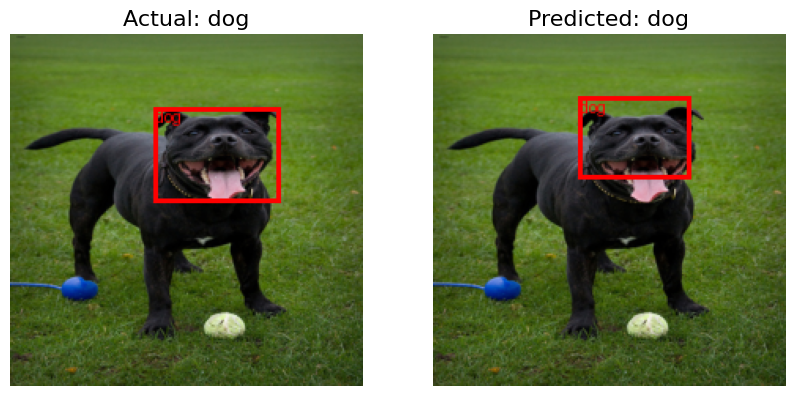

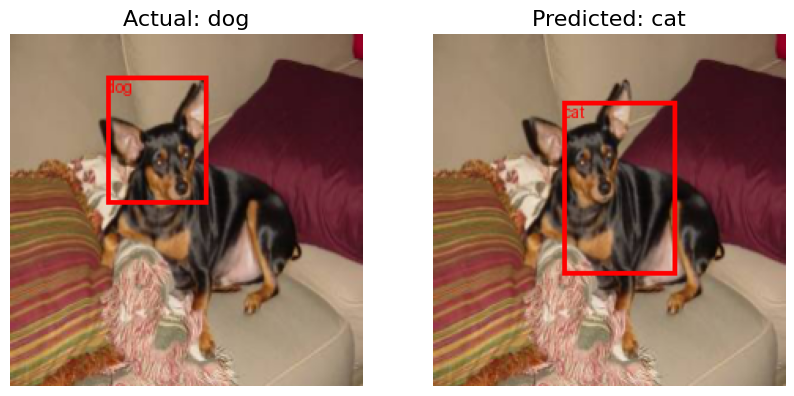

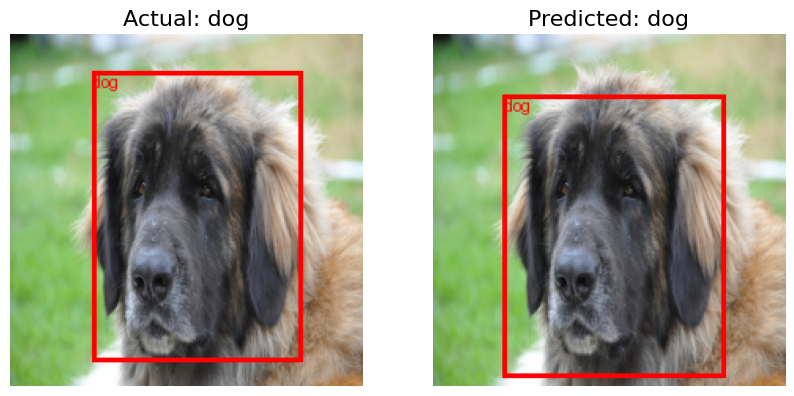

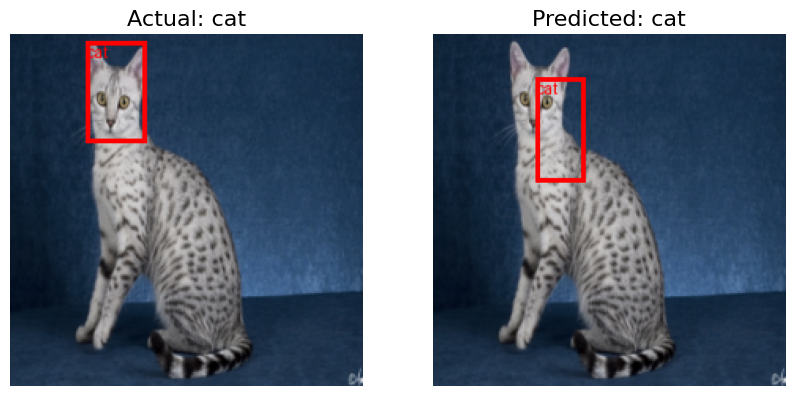

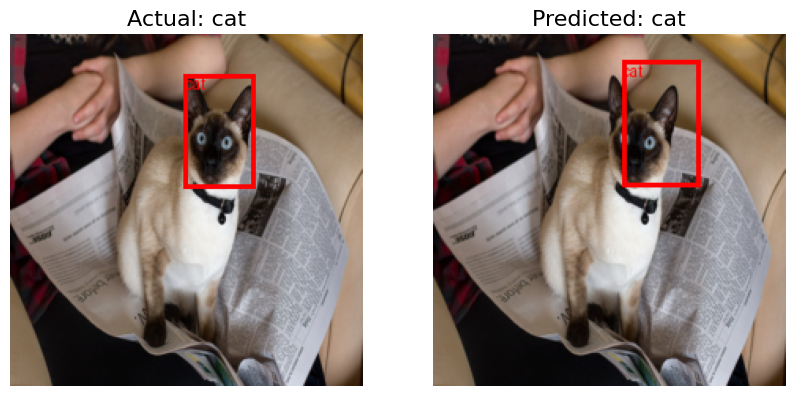

In [47]:
font = {'size'   : 6}
plt.rc('font', **font)

n_fig = 5

sample_images = images[:n_fig]
pred_bboxes = pred_bboxes[:n_fig]
pred_labels = torch.argmax(class_logits, dim=1)[:n_fig]
#
act_bboxes = bboxes[:n_fig]
act_labels = labels[:n_fig]


for i in range(n_fig):
    plt.figure(figsize=(10, 5))
    ax1=plt.subplot(1,2,1)
    img = draw_bbox(sample_images[i], act_bboxes[i], classes[act_labels[i].item()])
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Actual: {classes[act_labels[i].item()]}", fontsize=16)
    
    ax1=plt.subplot(1,2,2)
    img = draw_bbox(sample_images[i], pred_bboxes[i], classes[pred_labels[i].item()])
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Predicted: {classes[pred_labels[i].item()]}", fontsize=16)    
    plt.show()


# Implement Faster R-CNN

In [48]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn

# Load a pre-trained Faster R-CNN model with ResNet50-FPN backbone
model_fast_rcnn = fasterrcnn_resnet50_fpn(pretrained=True)

# Define number of classes and classifier input sise
num_classes = 2
in_features = model_fast_rcnn.roi_heads.box_predictor.cls_score.in_features

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
# Replace model_fast_rcnn's classifier with a one with the desired number of classes
model_fast_rcnn.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)


C:\Users\mrezv\anaconda3\envs\faiss-env\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\mrezv\anaconda3\envs\faiss-env\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [49]:
class FasterRcnnDogsCatsDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, annot_dir, transform=None, target_size=(224, 224)):
        self.image_dir = image_dir
        self.annot_dir = annot_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith(".png")]
        self.label_map = {"cat": 0, "dog": 1}  # 0 is background
        self.target_size = target_size  # for resizing boxes

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_filename = self.image_files[idx]
        img_path = os.path.join(self.image_dir, img_filename)
        annot_path = os.path.join(self.annot_dir, img_filename.replace(".png", ".xml"))

        image = Image.open(img_path).convert("RGB")
        original_width, original_height = image.size

        # Parse XML
        tree = ET.parse(annot_path)
        root = tree.getroot()
        obj = root.find("object")
        label = self.label_map[obj.find("name").text]
        bbox = obj.find("bndbox")
        xmin = float(bbox.find("xmin").text)
        ymin = float(bbox.find("ymin").text)
        xmax = float(bbox.find("xmax").text)
        ymax = float(bbox.find("ymax").text)

        # Scale bbox to match resized image size
        target_w, target_h = self.target_size
        x_scale = target_w / original_width
        y_scale = target_h / original_height

        xmin_scaled = xmin * x_scale
        xmax_scaled = xmax * x_scale
        ymin_scaled = ymin * y_scale
        ymax_scaled = ymax * y_scale
        
        boxes = torch.tensor([[xmin_scaled, ymin_scaled, xmax_scaled, ymax_scaled]], dtype=torch.float32)
        labels = torch.tensor([label], dtype=torch.int64)

        target = {"boxes": boxes, "labels": labels}

        if self.transform:
            image = self.transform(image)

        return image, target


In [50]:
from torchvision.transforms import ToTensor

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

image_dir="./Data/dog-and-cat-detection/images"
annot_dir="./Data/dog-and-cat-detection/annotations"
    
dataset = FasterRcnnDogsCatsDataset(image_dir, annot_dir, transform=transform, target_size=(224, 224))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=5, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))


In [51]:
# Split sizes (e.g., 80% train / 20% test)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size

# Random split
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

In [52]:
from torch.utils.data import DataLoader

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=5, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

test_dataset = torch.utils.data.DataLoader(test_dataset, batch_size=5, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))


In [53]:
for images, targets in train_loader:
    images = list(img.to(device) for img in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    break

In [54]:
targets

[{'boxes': tensor([[128.1280,  63.9039, 169.7920, 135.2072]]),
  'labels': tensor([1])},
 {'boxes': tensor([[34.4960,  0.5973, 97.2160, 94.9760]]),
  'labels': tensor([1])},
 {'boxes': tensor([[ 61.3760,  54.5340, 127.2320, 142.4921]]),
  'labels': tensor([0])},
 {'boxes': tensor([[ 87.2308,  17.9200, 208.3846, 136.6400]]),
  'labels': tensor([1])},
 {'boxes': tensor([[ 29.6092,  57.6000,  96.5517, 139.5200]]),
  'labels': tensor([0])}]

CPU times: total: 0 ns
Wall time: 0 ns


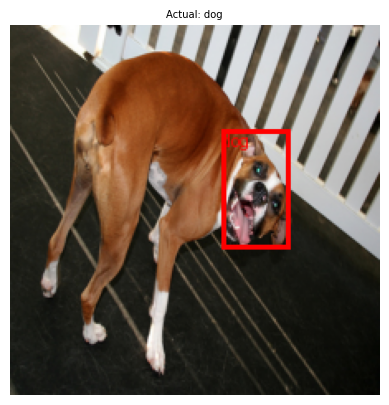

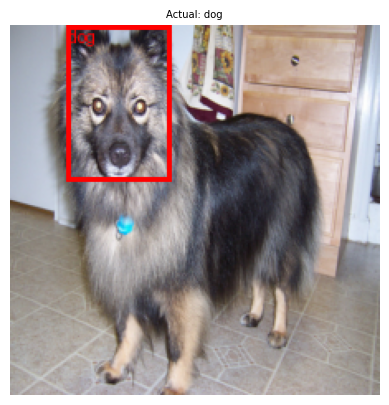

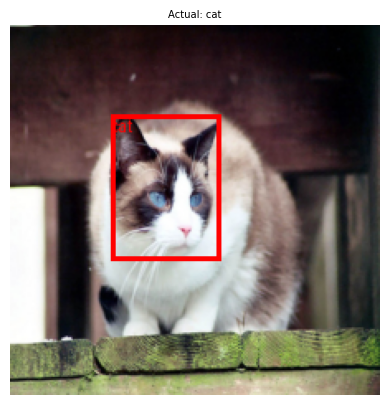

In [55]:
%time
classes = {0: "cat", 1: "dog"}

for i in range(3):
    sample_images = images[i]
    sample_bboxes = targets[i]['boxes']
    sample_labels = targets[i]['labels']
    img = draw_bbox(sample_images, sample_bboxes[0], classes[sample_labels.item()])
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Actual: {classes[sample_labels.item()]}")
    plt.show()


## Prediction

In [56]:
%time
model_fast_rcnn.to(device)
model_fast_rcnn.train()
optimizer = torch.optim.Adam(model_fast_rcnn.parameters(), lr=1e-4)

num_epochs = 2
for epoch in range(num_epochs):
    for images, targets in train_loader:
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model_fast_rcnn(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    print(f"Epoch {epoch+1} - Loss: {losses.item():.4f}")

CPU times: total: 0 ns
Wall time: 0 ns
Epoch 1 - Loss: 0.1005
Epoch 2 - Loss: 0.0754


In [57]:
model_fast_rcnn.eval()  # set model to eval mode
all_preds = []
all_actual = []

with torch.no_grad():
    for images, bboxes in test_dataset:
        images = [img.to(device) for img in images]

        # Run inference
        outputs = model_fast_rcnn(images)

        # Move outputs to CPU and store
        for i in range(len(images)):
            pred_boxes = outputs[i]['boxes'].cpu()
            pred_labels = outputs[i]['labels'].cpu()
            pred_scores = outputs[i]['scores'].cpu()

            all_preds.append({
                'boxes': pred_boxes,
                'labels': pred_labels,
                'scores': pred_scores,
                'image_id': i  # Optional: track which image
            })

            all_actual.append({
                'image': images[i],
                'bboxes': bboxes[i]
            })

In [142]:
pred_scores

tensor([0.0825, 0.0727])

## Look at Prediction 

In [165]:
# Look at the data
def draw_multiple_bbox(image, bbox, label, color='red', width=1, pred_scores=None):
    image = F.to_pil_image(image.cpu())
    draw = ImageDraw.Draw(image)
    if len(bbox)>=1:
        for ir in range(len(bbox)):
            draw.rectangle(bbox[ir].tolist(), outline=color, width=1)
            if pred_scores!=None:
                prd = int(np.round(pred_scores[ir],2)*100)
                label = f'{label}, Score={prd}%'
            else:
                label = f'{label}'            
            draw.text((bbox[ir][0].item(), bbox[ir][1].item()), label, fill=color)
    return image

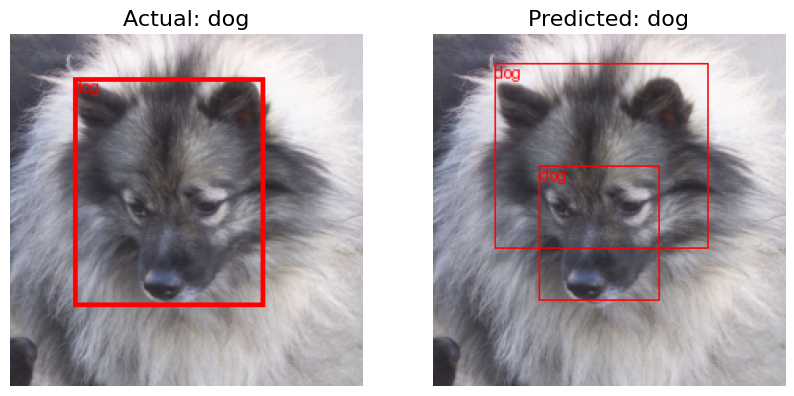

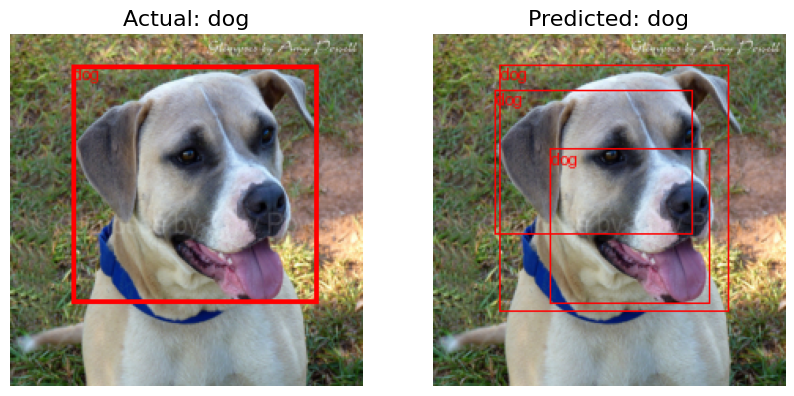

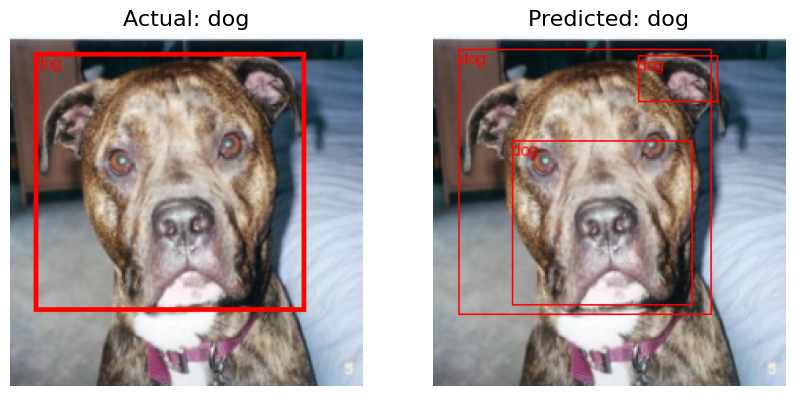

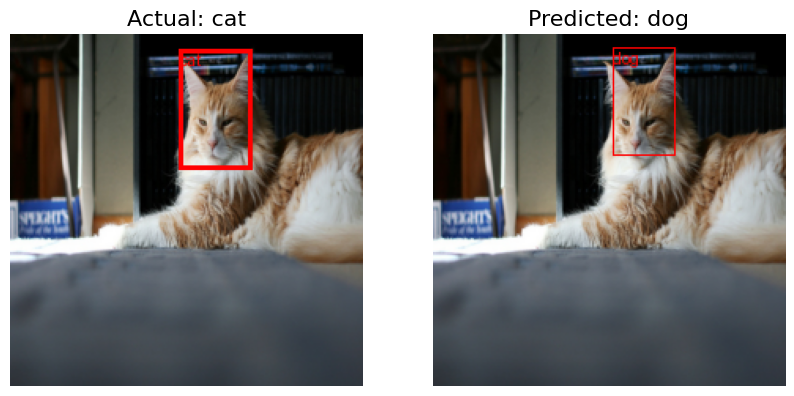

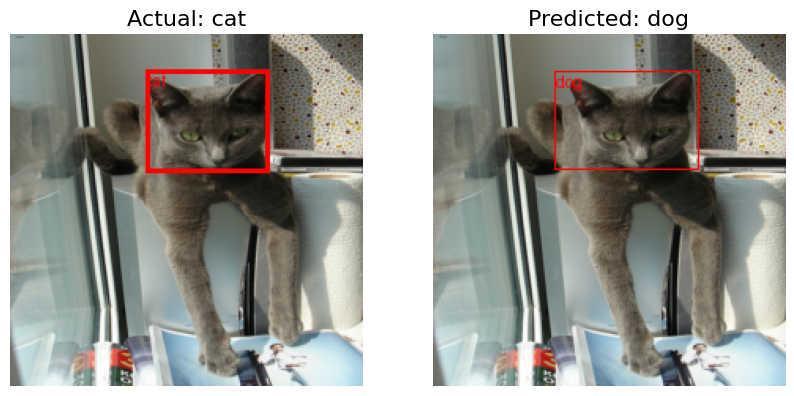

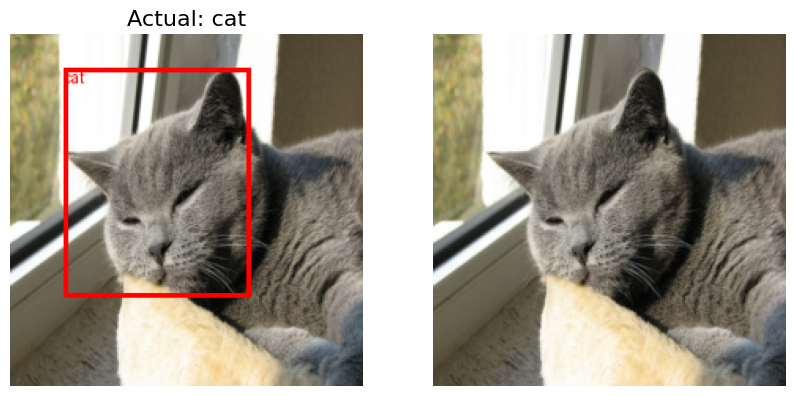

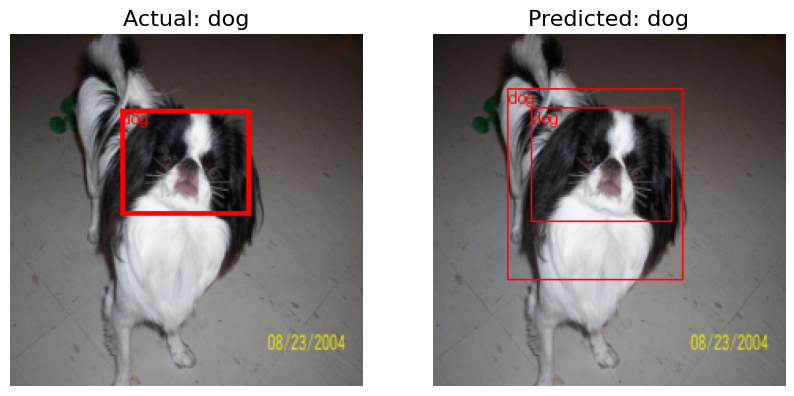

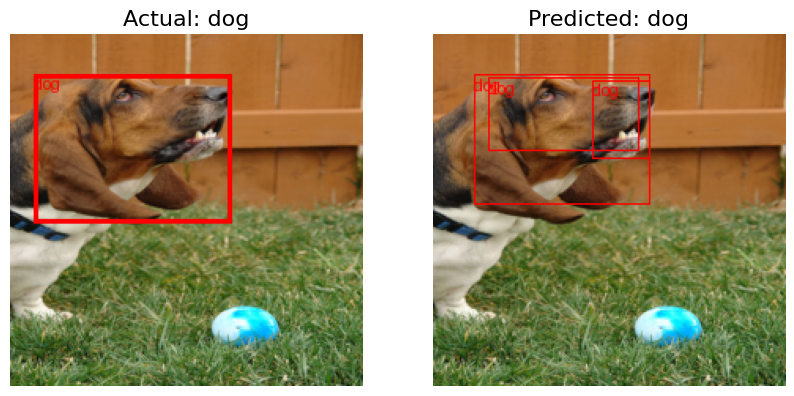

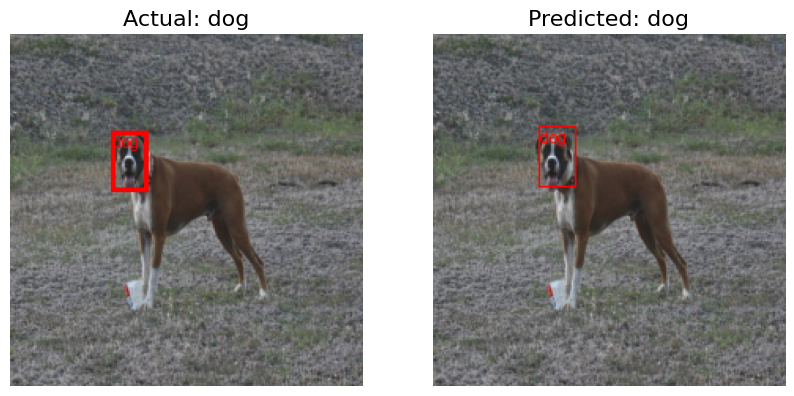

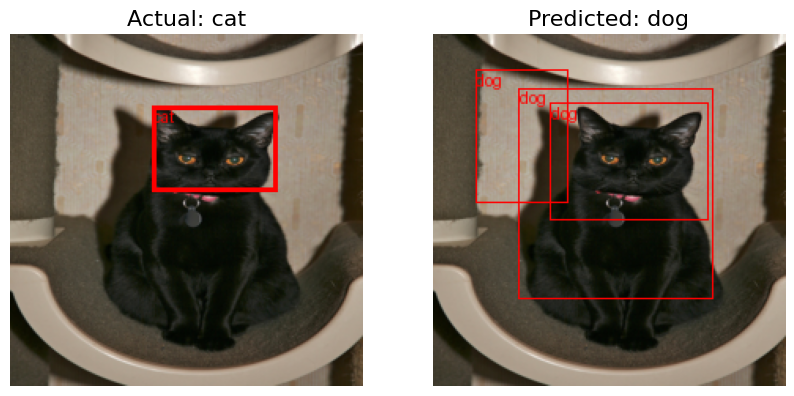

In [174]:
font = {'size'   : 6}
plt.rc('font', **font)

n_fig = 10

for i in range(n_fig):
    # Sample input
    sample_images = all_actual[i]['image']
    act_bboxes = all_actual[i]['bboxes']['boxes']
    act_label = all_actual[i]['bboxes']['labels']
    #
    prediction = all_preds[i] 
    
    # Extract data
    pred_boxes = prediction['boxes']
    pred_labels = prediction['labels']
    pred_scores = prediction['scores']
    
    # Apply a confidence threshold
    threshold = 0.15
    keep = pred_scores > threshold
    pred_boxes = pred_boxes[keep]
    pred_labels = [classes[l.item()] for l in pred_labels[keep]]    
    
    plt.figure(figsize=(10, 5))
    ax1=plt.subplot(1,2,1)
    img = draw_bbox(sample_images, act_bboxes[0], classes[act_label.item()])
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Actual: {classes[act_label.item()]}", fontsize=16)
    
    ax1=plt.subplot(1,2,2)
    if len(pred_labels)>=1:
        img = draw_multiple_bbox(sample_images, pred_boxes, pred_labels[0], pred_scores=None)
    else:
        img = draw_multiple_bbox(sample_images, pred_boxes, None, pred_scores=None)        
    plt.imshow(img)
    plt.axis("off")
    if len(pred_labels)>=1: plt.title(f"Predicted: {pred_labels[0]}", fontsize=16)    
    plt.show()


# Intersection over Union (IoU)

**Intersection over Union (IoU)** is a standard evaluation metric used in object detection tasks to measure how well the predicted bounding box matches the ground truth bounding box.

Here’s what each term means:
- **Object of interest**: The item in the image we want to detect (e.g., a dog).
- **Ground truth box**: The accurately labeled box that perfectly surrounds the object of interest (usually drawn by a human).
- **Predicted box**: The box output by the detection model.

**IoU is calculated as:**

$IoU = \frac{\text{Area of Overlap (Intersection)}}{\text{Area of Union}}$

- **Area of Intersection**: The area where the predicted box and the ground truth box overlap.
- **Area of Union**: The total area covered by both boxes combined (without double-counting the overlap).

**Interpretation:**
- **IoU = 0**: No overlap between the predicted and ground truth boxes.
- **IoU = 1**: Perfect overlap — the predicted box exactly matches the ground truth.
- **IoU > 0.5**: Generally considered a "good" prediction (threshold can vary based on task).

Figure below a Diagrammatic representation of the formula to calculate IOU:
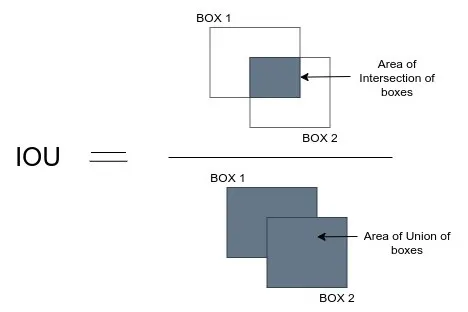

* **Small Example**

In [77]:
# Two sets of boxes (x1, y1, x2, y2)
bbox_1 = [63, 63, 162, 162]
bbox_2 = [71, 71, 178, 178]
bbox_1 = torch.tensor(bbox_1).unsqueeze(0)
bbox_2 = torch.tensor(bbox_2).unsqueeze(0)

In [78]:
from torchvision.ops import box_iou
iou = box_iou(bbox_1, bbox_2)
print(iou)

tensor([[0.6385]])


In [83]:
model_fast_rcnn.eval()  # set model to eval mode
with torch.no_grad():
    for images, bboxes in test_dataset:
        images = [img.to(device) for img in images]

        # Run inference
        outputs = model_fast_rcnn(images)
        break

In [84]:
print(outputs)

[{'boxes': tensor([[ 59.1766,  35.7878, 160.2520, 102.8107],
        [ 48.4511,  18.7178, 175.4347, 129.9121],
        [ 29.1291,  29.2868, 156.6243, 188.5912]]), 'labels': tensor([1, 1, 1]), 'scores': tensor([0.9580, 0.4953, 0.0535])}, {'boxes': tensor([[ 65.2527,  25.3158, 167.1676, 100.0974],
        [126.5162,  24.3283, 165.3551,  59.8299],
        [141.5926,  67.2581, 208.0837, 138.8255],
        [ 50.2338,  16.2549, 191.9981, 135.2037],
        [ 94.6246,  19.3349, 147.2737, 104.8754],
        [114.5969,  24.8429, 169.7292,  81.4180],
        [ 10.2869, 118.3336,  84.3468, 183.6370]]), 'labels': tensor([1, 1, 1, 1, 1, 1, 1]), 'scores': tensor([0.9674, 0.7978, 0.5249, 0.3867, 0.2823, 0.2576, 0.0500])}, {'boxes': tensor([[ 15.2346,  38.0855,  86.5071, 149.0240],
        [ 63.7119,  48.9329,  86.0664,  87.5123],
        [ 33.2000,  75.4455,  78.4895, 153.8040],
        [ 19.4210,  46.1877,  84.5977,  91.5905]]), 'labels': tensor([1, 1, 1, 1]), 'scores': tensor([0.3836, 0.3575, 0.128

In [93]:
boxes = outputs[0]["boxes"]
scores = outputs[0]["scores"]
print('------boxes------')
print(boxes)
print('\n')
print('------scores------')
print(scores)

------boxes------
tensor([[ 59.1766,  35.7878, 160.2520, 102.8107],
        [ 48.4511,  18.7178, 175.4347, 129.9121],
        [ 29.1291,  29.2868, 156.6243, 188.5912]])


------scores------
tensor([0.9580, 0.4953, 0.0535])


In [96]:
all_preds[0]['boxes']

tensor([[ 39.0378,  19.4280, 174.5359, 136.4559],
        [ 67.7851,  84.0135, 143.2345, 169.7757],
        [ 40.7384,  21.7338, 119.9496, 112.0267],
        [ 85.3279,  23.2526, 165.4138, 113.2446],
        [ 52.8781,  55.6788, 194.7459, 171.7679],
        [125.6090,  28.8947, 164.5665,  55.3016]])

## Non-Max Suppression (NMS)

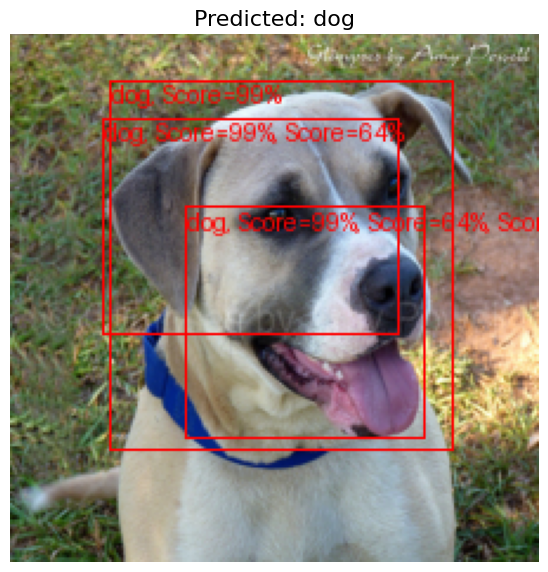

In [196]:
font = {'size'   : 6}
plt.rc('font', **font)
plt.figure(figsize=(15, 10))

i = 1
# Sample input
sample_images = all_actual[i]['image']
prediction = all_preds[i] 

# Extract data
pred_boxes = prediction['boxes']
pred_labels = prediction['labels']
pred_scores = prediction['scores']

# Apply a confidence threshold
threshold = 0.2
keep = pred_scores > threshold
pred_boxes = pred_boxes[keep]
pred_labels = [classes[l.item()] for l in pred_labels[keep]]   
    
ax1=plt.subplot(1,2,1)
#(image, bbox, label, color='red', width=1, pred_scores=None)
img = draw_multiple_bbox(sample_images, pred_boxes, pred_labels[0], color='red', pred_scores=pred_scores, width=2)
plt.imshow(img)
plt.axis("off")
plt.title(f"Predicted: {pred_labels[0]}", fontsize=16)    
plt.show()


**Non-Max Suppression (NMS)** is a popular technique used in object detection to filter and select the most relevant bounding boxes from many overlapping predictions.

**How it works:**
1. **Non-max (confidence filtering)**:  
   - Start by keeping only boxes that have a **high confidence score** (i.e., the model is confident they contain an object).
   
2. **Suppression (overlap filtering)**:  
   - From the remaining boxes, **keep the box with the highest confidence score**.
   - **Suppress (discard)** all other boxes that have a **high IoU** (i.e., large overlap) with this box — because they are likely duplicate detections.
   - Repeat the process for the next highest confidence box, and so on.


## Non-Max Suppression in PyTorch

In PyTorch, NMS is used to filter out redundant bounding boxes based on their confidence scores and overlap (IoU).

- **Boxes**: A tensor of shape `[N, 4]`, where each box is represented by 4 coordinates — typically `[x1, y1, x2, y2]` (top-left and bottom-right corners).
- **Scores**: A tensor of shape `[N]`, containing the confidence score for each bounding box (higher means more confident).
- **iou_threshold**: A float between `0.0` and `1.0`, specifying how much overlap is allowed. Boxes with IoU greater than this threshold are suppressed.

**Important:**  
The boxes **must be** in the `[x1, y1, x2, y2]` format for PyTorch’s `nms` to work correctly.

In [200]:
from torchvision.ops import nms

pred_boxes = prediction['boxes']
pred_labels = prediction['labels']
pred_scores = prediction['scores']

box_indices = nms(
boxes=pred_boxes,
scores=pred_scores,
iou_threshold=0.1,
)
print(box_indices)

tensor([0])


The output indices are filtered bounding boxes

In [205]:
filtered_boxes = pred_boxes[box_indices]
pred_scores[box_indices]

tensor([0.9896])

In [202]:
pred_labels = [classes[l.item()] for l in pred_labels]   

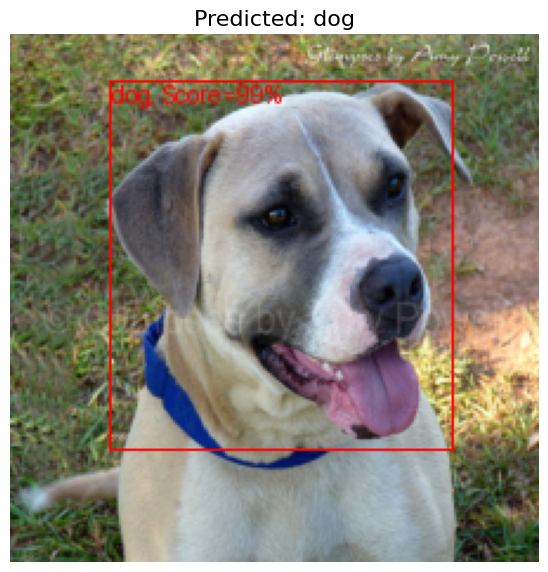

In [204]:
font = {'size'   : 6}
plt.rc('font', **font)
plt.figure(figsize=(15, 10))

ax1=plt.subplot(1,2,1)
#(image, bbox, label, color='red', width=1, pred_scores=None)
img = draw_multiple_bbox(sample_images, pred_boxes[box_indices], 
                         pred_labels[box_indices], color='red', pred_scores=pred_scores[box_indices], width=2)
plt.imshow(img)
plt.axis("off")
plt.title(f"Predicted: {pred_labels[box_indices]}", fontsize=16)    
plt.show()
